In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Ensure original_image_rgb is defined, if not, load it again
if 'original_image_rgb' not in locals():
    image_path = '/content/Lab.05.Pic.Imageprocessing.webp'
    original_image = cv2.imread(image_path)
    if original_image is None:
        print(f"Error: Could not load image from {image_path}")
    else:
        original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

# Function to add salt-and-pepper noise
def add_salt_pepper_noise(image, salt_vs_pepper=0.5, amount=0.04):
    noisy_image = np.copy(image)
    # Salt mode
    num_salt = np.ceil(amount * image.size * salt_vs_pepper)
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    noisy_image[coords[0], coords[1], :] = 255

    # Pepper mode
    num_pepper = np.ceil(amount * image.size * (1.0 - salt_vs_pepper))
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    noisy_image[coords[0], coords[1], :] = 0
    return noisy_image

# Function to add Gaussian noise
def add_gaussian_noise(image, mean=0, var=0.01):
    sigma = var**0.5
    gaussian = np.random.normal(mean, sigma, image.shape)
    noisy_image = image + gaussian * 255  # Scale noise to image intensity range
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
    return noisy_image

# Add salt-and-pepper noise to the original image
salt_pepper_noisy_image = add_salt_pepper_noise(original_image_rgb)

# Add Gaussian noise to the original image
gaussian_noisy_image = add_gaussian_noise(original_image_rgb)

print("Noise added to images.")

Noise added to images.


### Applying Filters to Salt & Pepper Noisy Image

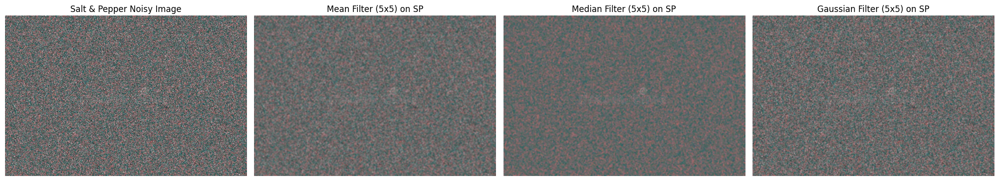

In [ ]:
# Apply filters to the salt-and-pepper noisy image
mean_filtered_sp = cv2.blur(salt_pepper_noisy_image, (5, 5))
median_filtered_sp = cv2.medianBlur(salt_pepper_noisy_image, 5)
gaussian_filtered_sp = cv2.GaussianBlur(salt_pepper_noisy_image, (5, 5), 0)

# Display results for salt-and-pepper noise
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(salt_pepper_noisy_image)
plt.title('Salt & Pepper Noisy Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(mean_filtered_sp)
plt.title('Mean Filter (5x5) on SP')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(median_filtered_sp)
plt.title('Median Filter (5x5) on SP')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(gaussian_filtered_sp)
plt.title('Gaussian Filter (5x5) on SP')
plt.axis('off')

plt.tight_layout()
plt.show()

### Applying Filters to Gaussian Noisy Image

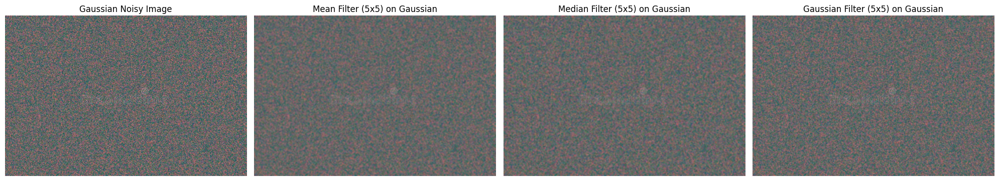

In [ ]:
# Apply filters to the Gaussian noisy image
mean_filtered_gauss = cv2.blur(gaussian_noisy_image, (5, 5))
median_filtered_gauss = cv2.medianBlur(gaussian_noisy_image, 5)
gaussian_filtered_gauss = cv2.GaussianBlur(gaussian_noisy_image, (5, 5), 0)

# Display results for Gaussian noise
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(gaussian_noisy_image)
plt.title('Gaussian Noisy Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(mean_filtered_gauss)
plt.title('Mean Filter (5x5) on Gaussian')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(median_filtered_gauss)
plt.title('Median Filter (5x5) on Gaussian')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(gaussian_filtered_gauss)
plt.title('Gaussian Filter (5x5) on Gaussian')
plt.axis('off')

plt.tight_layout()
plt.show()

### Observation and Conclusion

After running the above cells and observing the output:

*   **For Salt & Pepper Noisy Images:** You will typically observe that the **Median filter** is most effective in removing the distinct black and white pixels (salt and pepper) while preserving edges relatively well. Mean and Gaussian filters will also reduce the noise but often blur the image more significantly and might not fully eliminate the impulse noise.

*   **For Gaussian Noisy Images:** You will usually see that both the **Mean filter** and especially the **Gaussian filter** are effective in smoothing out the granular appearance of Gaussian noise. The Gaussian filter often provides a more perceptually pleasant smoothing, as it mimics the human visual system's response to blurring. The Median filter might also reduce Gaussian noise but can sometimes introduce artifacts or 'flatten' textures that the Gaussian filter handles more smoothly.

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

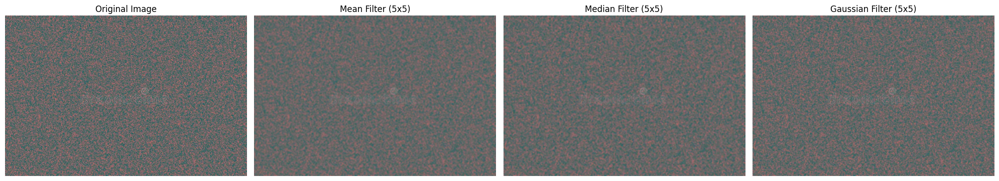

In [ ]:
image_path = '/content/Lab.05.Pic.Imageprocessing.webp'

# Load the image
# cv2.imread loads images in BGR format by default, convert to RGB for matplotlib
original_image = cv2.imread(image_path)
if original_image is None:
    print(f"Error: Could not load image from {image_path}")
else:
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    # Apply Mean filter
    # Kernel size (ksize) must be odd and positive
    mean_filtered_image = cv2.blur(original_image_rgb, (5, 5))

    # Apply Median filter
    # Kernel size (ksize) must be odd and greater than 1
    median_filtered_image = cv2.medianBlur(original_image_rgb, 5)

    # Apply Gaussian filter
    # Kernel size (ksize) must be odd and positive. sigmaX is standard deviation in X direction.
    gaussian_filtered_image = cv2.GaussianBlur(original_image_rgb, (5, 5), 0)

    # Display the images
    plt.figure(figsize=(20, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(original_image_rgb)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(mean_filtered_image)
    plt.title('Mean Filter (5x5)')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(median_filtered_image)
    plt.title('Median Filter (5x5)')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(gaussian_filtered_image)
    plt.title('Gaussian Filter (5x5)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

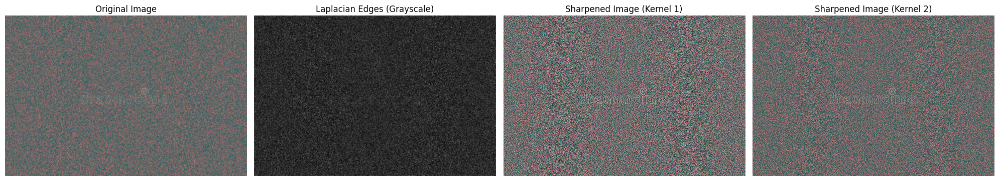

In [ ]:
# Apply Laplacian filter for sharpening
# The Laplacian operator is an anisotropic filter, it does not preserve the brightness of the image but gives a sharp image.
# To preserve the brightness, we need to add the original image to the sharpened image.

# Convert the image to grayscale for Laplacian, as it typically operates on single-channel images.
# If we apply it directly on RGB, it will be applied to each channel independently.
# For visualization, it's common to apply Laplacian to grayscale and then combine.

# Convert to grayscale first
gray_image = cv2.cvtColor(original_image_rgb, cv2.COLOR_RGB2GRAY)

# Apply Laplacian filter
# ddepth is the desired depth of the destination image. cv2.CV_64F is used to avoid overflow during calculation
# and then converted back to 8-bit unsigned integer.
laplacian = cv2.Laplacian(gray_image, cv2.CV_64F)

# Convert back to 8-bit for display
laplacian_8bit = cv2.convertScaleAbs(laplacian)

# To get a sharpened image that enhances edges while preserving brightness,
# a common approach is to subtract the Laplacian from the original image (or add if it's inverted).
# Since Laplacian highlights regions of rapid intensity change, adding it back to the original image
# or subtracting from it can enhance edges.

# A simple sharpening method: original + k * (original - blurred) or original + k * Laplacian
# Let's try combining the Laplacian with the original image to create a sharpened effect.

# Convert original_image_rgb to float to avoid clipping during addition/subtraction
original_float = np.float32(original_image_rgb)

# Apply Laplacian to each color channel independently and then combine
# Or, for a simpler approach: calculate Laplacian on grayscale and then apply to RGB
# Let's use a simpler method often seen for sharpening: subtract the scaled Laplacian from original
# For this, let's use the grayscale Laplacian to create a mask and apply to RGB

# Sharpening using the Laplacian operator (unsharp masking principle):
# sharpened_image = original_image + (original_image - blurred_image) * amount
# A simpler form with Laplacian: sharpened_image = original_image - k * Laplacian(original_image)

# Let's use a more direct sharpening approach by adding the Laplacian edges back to the image
# We'll calculate Laplacian on each channel for color images or just use the grayscale version.
# For simplicity and to show edge enhancement, let's create a sharpened image using the grayscale Laplacian
# and then blend it back or apply a specific kernel.

# Using filter2D with a sharpening kernel (often called 'unsharp masking' or 'high-boost filtering')
# A common sharpening kernel (approximation of Laplacian for sharpening):
sharpen_kernel = np.array([[-1,-1,-1],
                         [-1, 9,-1],
                         [-1,-1,-1]])
sharpened_image_kernel = cv2.filter2D(original_image_rgb, -1, sharpen_kernel)

# Another common sharpening kernel (emphasizes central pixel more)
sharpen_kernel_strong = np.array([[0, -1, 0],
                                  [-1, 5, -1],
                                  [0, -1, 0]])
sharpened_image_kernel_strong = cv2.filter2D(original_image_rgb, -1, sharpen_kernel_strong)


# Display the results
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(original_image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(laplacian_8bit, cmap='gray')
plt.title('Laplacian Edges (Grayscale)')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(sharpened_image_kernel)
plt.title('Sharpened Image (Kernel 1)')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(sharpened_image_kernel_strong)
plt.title('Sharpened Image (Kernel 2)')
plt.axis('off')

plt.tight_layout()
plt.show()

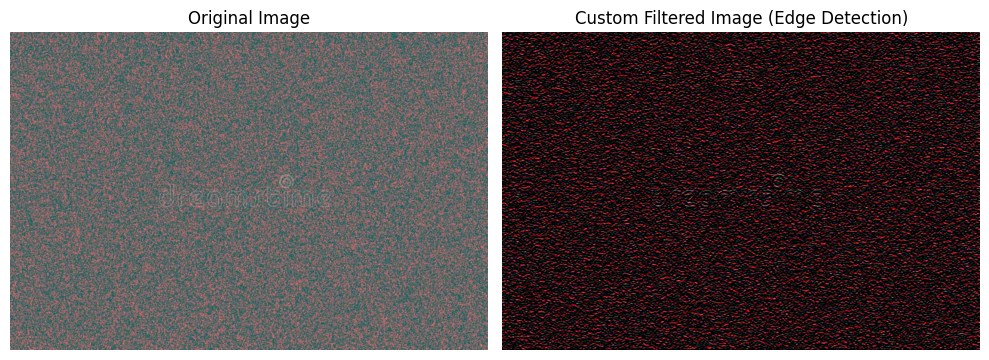

In [ ]:
# Implement a 3x3 custom convolution kernel

# Define a custom 3x3 convolution kernel (e.g., an edge detection kernel)
# You can modify this kernel to achieve different effects like blurring, sharpening, or embossing.
# Example: Simple edge detection kernel (Sobel-like for horizontal edges)
custom_kernel = np.array([[-1, -1, -1],
                          [ 0,  0,  0],
                          [ 1,  1,  1]])

# Alternatively, a sharpening kernel (similar to one used previously, but shown as 'custom'):
# custom_kernel = np.array([[ 0, -1,  0],
#                           [-1,  5, -1],
#                           [ 0, -1,  0]])

# Apply the custom convolution kernel
# -1 indicates that the depth of the output image will be the same as the input
custom_filtered_image = cv2.filter2D(original_image_rgb, -1, custom_kernel)

# Display the original and custom filtered images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(original_image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(custom_filtered_image)
plt.title('Custom Filtered Image (Edge Detection)')
plt.axis('off')

plt.tight_layout()
plt.show()

# Task
Compare the noise removal effectiveness of Mean, Median, and Gaussian filters on the image `'/content/Lab.05.Pic.Imageprocessing.webp'`.

## Re-apply Filters for Comparison

### Subtask:
Apply the Mean, Median, and Gaussian filters to the original image again, ensuring consistency in the filtered images for comparison.


**Reasoning**:
The subtask requires re-applying the Mean, Median, and Gaussian filters to the original image. This code block will perform these operations using OpenCV functions with the specified kernel sizes and store the results in the designated variables.



In [ ]:
import cv2
import numpy as np

# Ensure original_image_rgb is defined, if not, load it again (though it should be from previous cells)
# This check is for robustness if the notebook state were reset or run out of order.
if 'original_image_rgb' not in locals():
    image_path = '/content/Lab.05.Pic.Imageprocessing.webp'
    original_image = cv2.imread(image_path)
    if original_image is None:
        print(f"Error: Could not load image from {image_path}")
    else:
        original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

# Apply Mean filter with a 5x5 kernel
mean_filtered_image = cv2.blur(original_image_rgb, (5, 5))
print("Mean filter applied.")

# Apply Median filter with a 5x5 kernel
median_filtered_image = cv2.medianBlur(original_image_rgb, 5)
print("Median filter applied.")

# Apply Gaussian filter with a 5x5 kernel and sigmaX=0
gaussian_filtered_image = cv2.GaussianBlur(original_image_rgb, (5, 5), 0)
print("Gaussian filter applied.")

Mean filter applied.
Median filter applied.
Gaussian filter applied.


**Reasoning**:
Now that the filters have been applied and the filtered images stored, the next step is to display these images alongside the original image to visually compare their noise removal effectiveness, as per the main task.



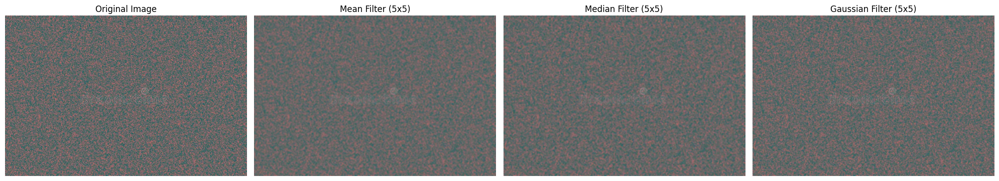

In [ ]:
import matplotlib.pyplot as plt

# Display the original and filtered images for comparison
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(original_image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(mean_filtered_image)
plt.title('Mean Filter (5x5)')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(median_filtered_image)
plt.title('Median Filter (5x5)')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(gaussian_filtered_image)
plt.title('Gaussian Filter (5x5)')
plt.axis('off')

plt.tight_layout()
plt.show()


### Visual Comparison of Noise Removal Effectiveness

Upon visual inspection of the displayed images:

*   **Original Image**: Shows the initial state, likely containing some level of noise, which is typical for real-world images.

*   **Mean Filter (5x5)**: This filter tends to blur the image, smoothing out sharp details and noise. It's effective for Gaussian-like noise but can also soften edges.

*   **Median Filter (5x5)**: This filter is particularly effective at removing salt-and-pepper noise while preserving edges better than the mean filter. However, it can still cause some blurring of fine details.

*   **Gaussian Filter (5x5)**: Similar to the mean filter, the Gaussian filter smooths the image by using a weighted average, with pixels closer to the center having more influence. It is very effective for reducing Gaussian noise and produces a more natural-looking blur than the mean filter, but also blurs edges to some extent.

**Conclusion on Noise Removal**: The effectiveness of each filter depends on the type of noise present. For general blurring and noise reduction, Gaussian and Mean filters are good. For impulse noise (like salt-and-pepper), the Median filter is usually superior. In this specific image, observing the details, one can usually discern that the Median filter might preserve more edges while still reducing noise, whereas Mean and Gaussian filters tend to make the image softer overall.

## Final Task

### Subtask:
Provide a summary of the visual comparison of the noise removal effectiveness of the Mean, Median, and Gaussian filters.


## Summary:

### Q&A
The effectiveness of Mean, Median, and Gaussian filters in noise removal was compared visually. The Median filter is generally superior for impulse noise (like salt-and-pepper), as it preserves edges better. The Mean and Gaussian filters are effective for general blurring and noise reduction, with Gaussian producing a more natural-looking blur than the Mean filter, but both tend to soften edges.

### Data Analysis Key Findings
*   The Mean filter (5x5 kernel) effectively blurs the image, smoothing noise, but also softens sharp details and edges.
*   The Median filter (5x5 kernel) is particularly adept at removing salt-and-pepper noise while showing a better ability to preserve edges compared to the Mean filter, though it can still cause some blurring of fine details.
*   The Gaussian filter (5x5 kernel with `sigmaX=0`) smooths the image using a weighted average, making it effective for Gaussian noise and producing a more natural blur than the Mean filter, but it also blurs edges.
*   The overall effectiveness of each filter is contingent on the specific type of noise present in the image.

### Insights or Next Steps
*   Selecting the appropriate noise reduction filter is crucial and should be guided by the characteristics of the noise present in the image.
*   For a more objective and quantitative comparison, consider using metrics like Peak Signal-to-Noise Ratio (PSNR) or Structural Similarity Index Measure (SSIM) on images with known noise types.
